# Setup envirement
Import packages

In [1]:
import cv2

import numpy as np
from matplotlib.colors import LogNorm
from scipy import signal
import utils

In [2]:
from typing import List, Tuple, Any, Callable

In [3]:
%matplotlib notebook
import matplotlib.pyplot as plt

# Hybrid images
The goal is to create hybrid images using the approach described in the [*SIGGRAPH 2006* paper by Oliva, Torralba, and Schyns](https://stanford.edu/class/ee367/reading/OlivaTorralb_Hybrid_Siggraph06.pdf). 

Hybrid images are static images that change in interpretation as a function of the viewing distance. The basic idea is that high frequency tends to dominate perception when it is available, but, at a distance, only the low frequency (smooth) part of the signal can be seen. By blending the high frequency portion of one image with the low-frequency portion of another, you get a hybrid image that leads to different interpretations at different distances.

## Prepare images

### Read images
For this task I use the image of my beautiful cat Jula (isn't she cute?), and a white seal found on the web

In [4]:
img1_file = 'seal.jpg'
img2_file = 'jula.jpg'

img1 = cv2.imread(img1_file, cv2.IMREAD_GRAYSCALE)
img2 = cv2.imread(img2_file, cv2.IMREAD_GRAYSCALE)

img1 = np.float32(img1 / 255.0)
img2 = np.float32(img2 / 255.0)

### Align images

We first need to align two images, and in order to do that, I use a provided sample code that takes two points on each image and align them accordingly.

<IPython.core.display.Javascript object>


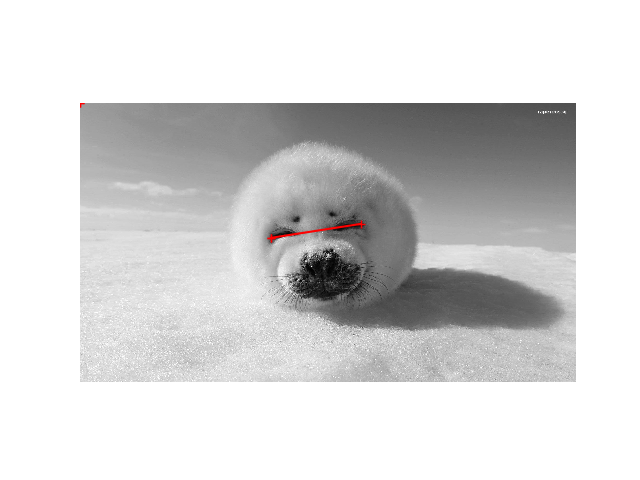

In [5]:
pts_img1 = utils.prompt_eye_selection(img1)
plt.plot(pts_img1[:,0], pts_img1[:,1], 'r-+')

<IPython.core.display.Javascript object>


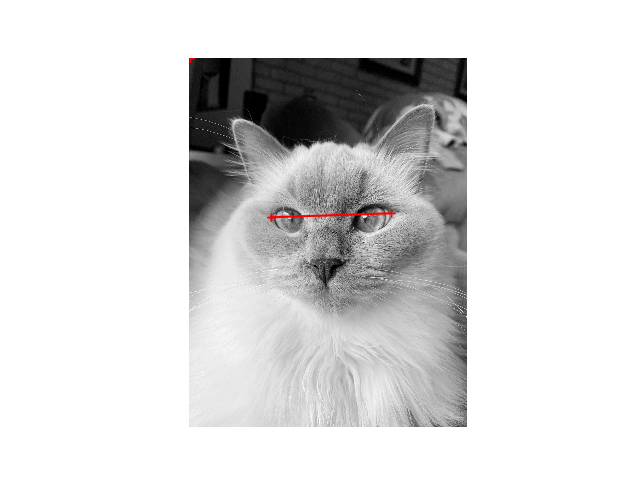

In [6]:
pts_img2 = utils.prompt_eye_selection(img2)
plt.plot(pts_img2[:,0], pts_img2[:,1], 'r-+')

In [7]:
img1, img2 = utils.align_images(img1_file, img2_file, pts_img1, pts_img2, save_images=False)

In [8]:
img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY) / 255.0
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY) / 255.0

### Display images

In [9]:
%matplotlib inline

In [10]:
def _display(
    img: np.ndarray,
    fig = None,
    nrow: int = 1, 
    ncol: int = 1,
    pos: int = 1,
    title: str = '',
    hide_axis: bool = True,
    **imshow_args: Any
) -> None:
    if not fig:
        fig = plt.figure(figsize=(4, 4))
    
    ax = fig.add_subplot(nrow, ncol, pos)
    ax.imshow(img, **imshow_args)
    ax.set_title(title)
    if hide_axis:
        ax.axis('off')

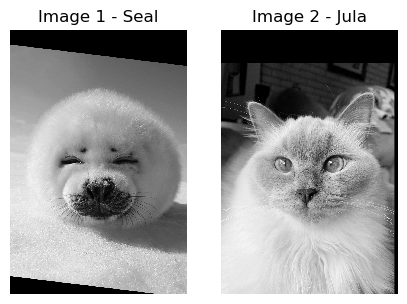

In [11]:
fig = plt.figure(figsize=(5, 5))

_display(img1, fig=fig, nrow=1, ncol=2, pos=1, title='Image 1 - Seal', cmap='gray',)    
_display(img2, fig=fig, nrow=1, ncol=2, pos=2, title='Image 2 - Jula', cmap='gray',)    

## Make hybrid images
Now when our images are perfectly aligned we can start creating a *hybrid image*.

I need to define a few things first:
- Gaussian 2D kernel
- Low pass filter
- High pass filter

In [12]:
def _2d_gaussian(sigma: float) -> np.ndarray:
    ksize = np.int(np.ceil(sigma)*6+1)
    gaussian_1d = cv2.getGaussianKernel(ksize, sigma)
    gaussian_2d = gaussian_1d*np.transpose(gaussian_1d)
    return gaussian_2d

In [13]:
def _low_pass_filter(img: np.ndarray, sigma: float) -> np.ndarray:
    return cv2.filter2D(img, -1, _2d_gaussian(sigma))

def _high_pass_filter(img: np.ndarray, sigma: float) -> np.ndarray:
    return img - cv2.filter2D(img, -1, _2d_gaussian(sigma))

In [14]:
def hybrid_image(img1: np.ndarray, img2: np.ndarray, sigma_low: float, sigma_high: float) -> np.ndarray:
    img1_gaussian = _low_pass_filter(img1, sigma_low)
    img2_gaussian = _high_pass_filter(img2, sigma_high)

    img_hybrid = img1_gaussian + img2_gaussian
    return img_hybrid

### Impact of sigma value
As we all know, the sigma controls the variation around its mean value. Before I try to create a hybrid image, I need to define the best sigma value for both low pass and high pass filters.

In [15]:
def sigma_analysis(img: np.ndarray, step: int, n_samples: int, _filter: np.ndarray, save_name: str = None) -> None:
    sigma_values = np.arange(0, step * n_samples, step).tolist()
    fig = plt.figure(figsize=(10, 6))
    c = 1

    for sigma in sigma_values:
        img_filtered = _filter(img, sigma)
        _display(
            fig=fig, nrow=2, ncol=len(sigma_values), pos=c,
            img=img_filtered, title=f'Sgima {sigma}', cmap='gray'
        )
        c += 1

        fft = np.abs(np.fft.fftshift(np.fft.fft2(img_filtered)))
        _display(
            fig=fig, nrow=2, ncol=len(sigma_values), pos=n_samples - 1 + c,
            img=fft, cmap='jet', norm=(LogNorm(fft.min(), fft.max()) if fft.max() > 0 else None)
        )   
    if save_name:
        plt.savefig(save_name, bbox_inches='tight')

#### low-pass filter

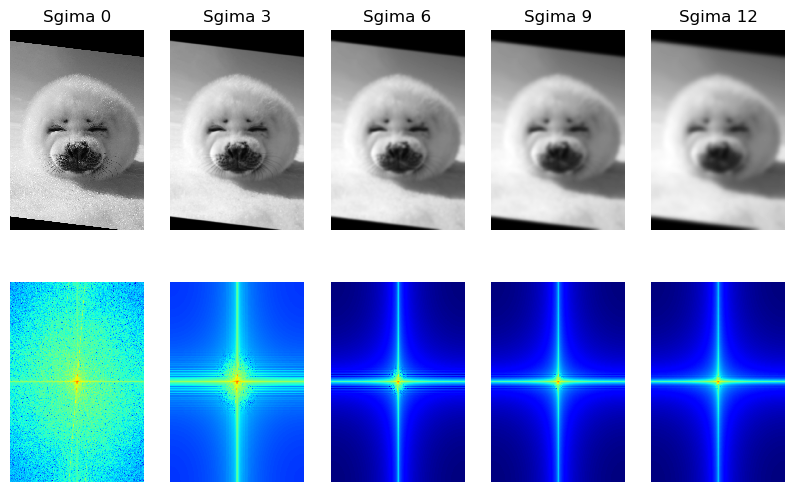

In [16]:
sigma_analysis(img1, 3, 5, _low_pass_filter)

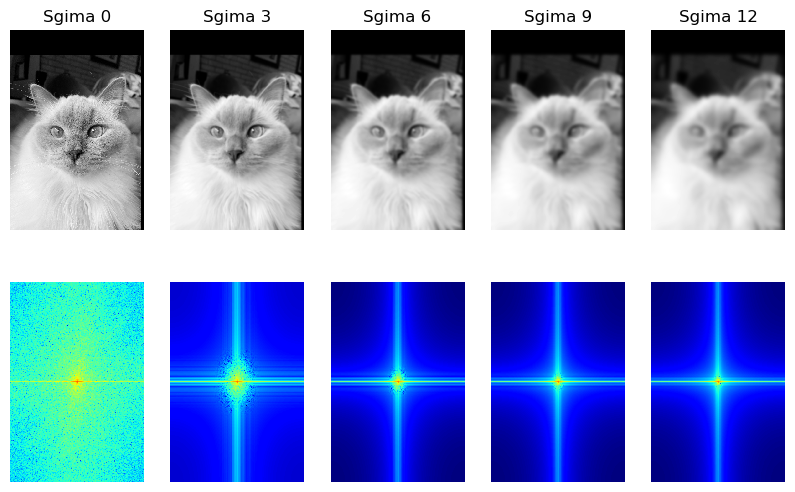

In [17]:
sigma_analysis(img2, 3, 5, _low_pass_filter)

#### high-pass filter

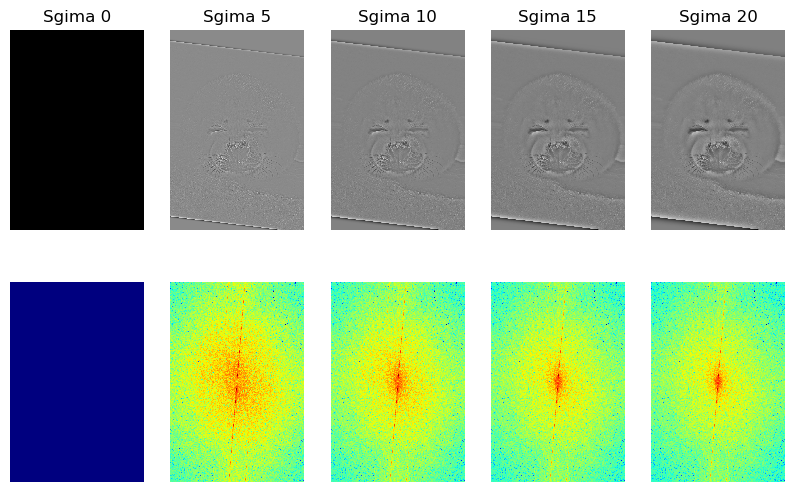

In [18]:
sigma_analysis(img1, 5, 5, _high_pass_filter)

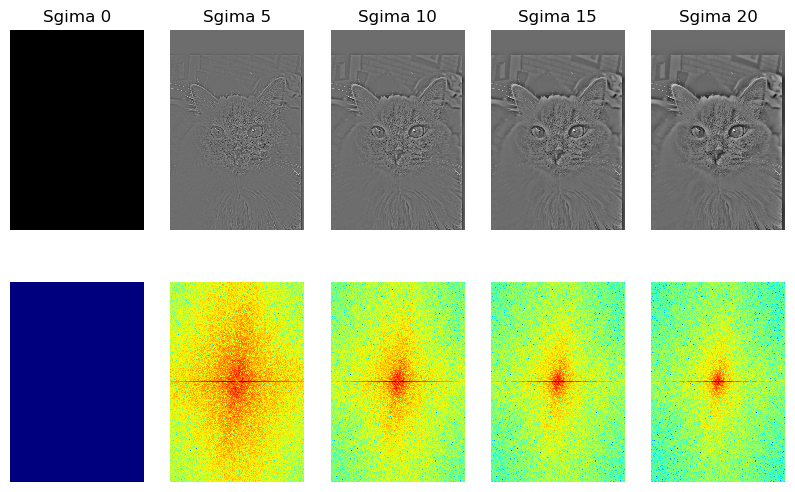

In [19]:
sigma_analysis(img2, 5, 5, _high_pass_filter)

### Finding the best sigma value
Based on the generated images with different sigma values, I can shrink my field of search. Thanks to that, I can now run the classic 'brute force' method and find visually the best pair of sigma values.

In [20]:
def bruteforce(
    img1: np.ndarray, img2: np.ndarray, 
    sl_min: int, sl_max: int, l_samples: int, 
    sh_min: int, sh_max: int, h_samples: int,
    save_name: str = None
) -> None:
    fig = plt.figure(figsize=(16, 14))
    c = 1
    
    sl_step = (sl_max - sl_min) // l_samples
    sh_step = (sh_max - sh_min) // h_samples
    sl_range = range(sl_min, sl_max, sl_step)
    sh_range = range(sh_min, sh_max, sh_step)
    
    for sigma_low in sl_range:
        for sigma_high in sh_range: 
            img_hybrid = hybrid_image(img1, img2, sigma_low, sigma_high)
            _display(
                fig=fig, nrow=l_samples, ncol=h_samples, pos=c, 
                img=img_hybrid, title=f's_low {sigma_low} | s_high {sigma_high}', cmap='gray'
            )
            c += 1
    if save_name:
        plt.savefig(save_name, bbox_inches='tight')

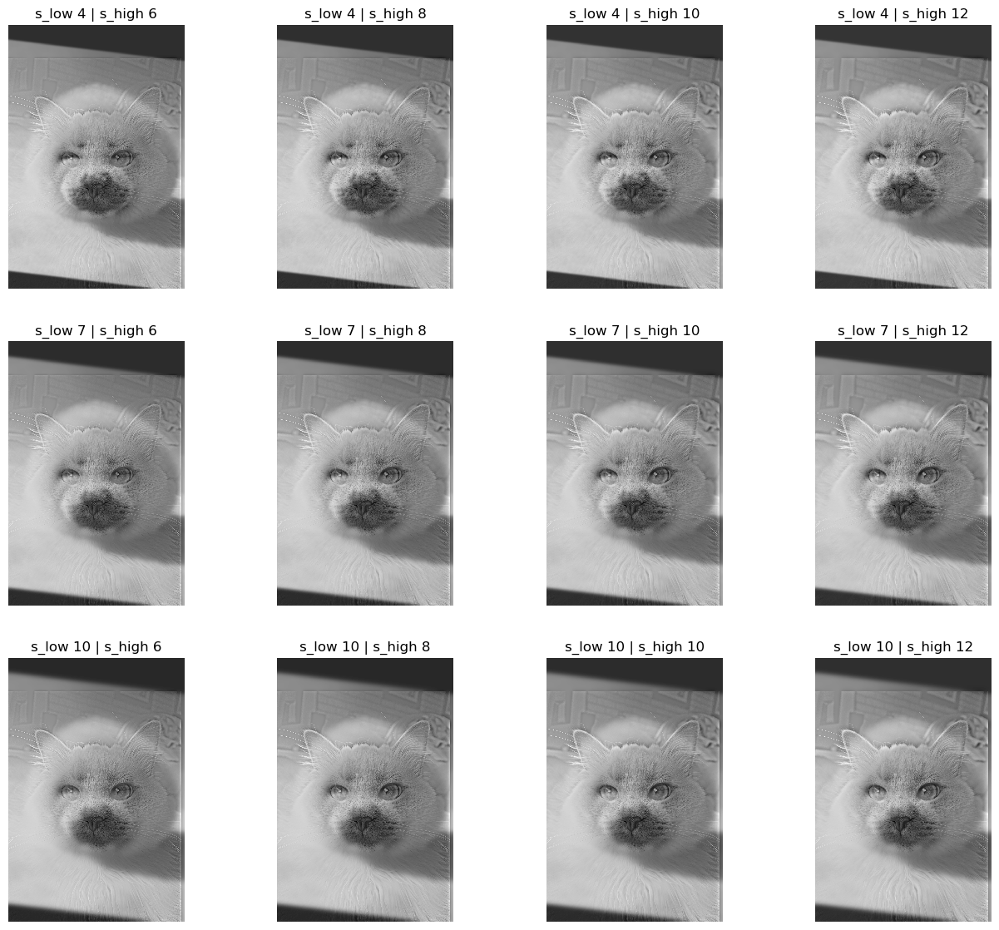

In [21]:
sigma_low_min, sigma_low_max = 4, 13
sigma_high_min, sigma_high_max = 6, 14
n_samples_low, n_samples_high = 3, 4

bruteforce(
    img1, img2, 
    sigma_low_min, sigma_low_max, n_samples_low, 
    sigma_high_min, sigma_high_max, n_samples_high
)

In my opinion the best pair of values in my opinion is `sigma_low` = 7 and `sigma_high` = 8. 

## Visualization
I aligned the images, defined 'the best' sigma values, and now it's time for the final visualization!

In [22]:
best_s_low = 7
best_s_high = 8

img_hybrid = hybrid_image(img1, img2, best_s_low, best_s_high)

### Crop image

<IPython.core.display.Javascript object>


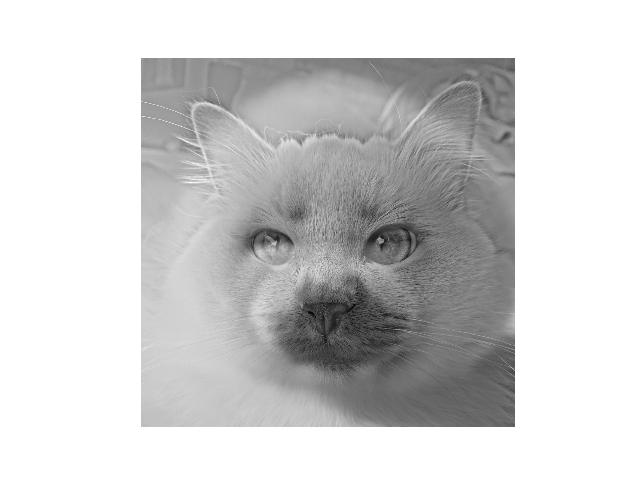

In [23]:
%matplotlib notebook
img_hybrid_cropped = utils.interactive_crop(img_hybrid)

In [24]:
img_hybrid = img_hybrid_cropped['cropped_image']

### Display at different scale

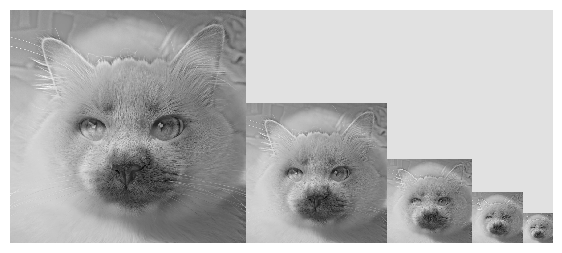

In [25]:
%matplotlib inline
fig = plt.figure(figsize=(7, 7))

num = 5
resized_imgs = [img_hybrid]
max_width = img_hybrid.shape[1]
max_height = img_hybrid.shape[0]

for i in range(1, num):
    resized_img = cv2.resize(img_hybrid, (0, 0), fx=0.6**i, fy=0.6**i)
    max_width += resized_img.shape[1]
    resized_imgs.append(resized_img)

stacked_imgs = np.ones((max_height, max_width))

current_x = 0
for img in resized_imgs:
    stacked_imgs[max_height - img.shape[0]:, current_x:img.shape[1] + current_x] = img
    current_x += img.shape[1]

_display(stacked_imgs, fig=fig, cmap='gray')

### Gaussian/Laplacian Pyramid

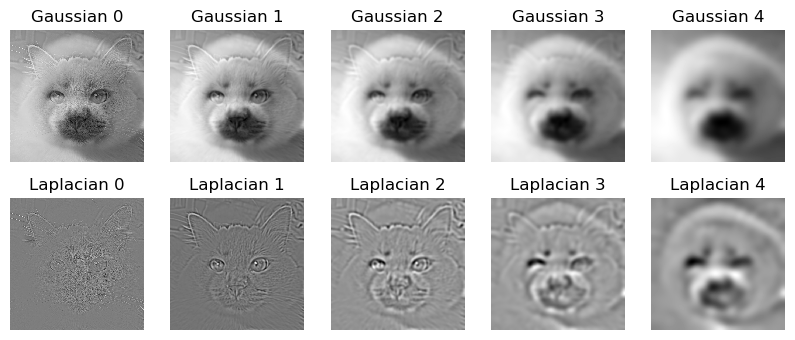

In [26]:
num = 5
sigma = 2

fig = plt.figure(figsize=(10, 4))
c = 1

temp = img_hybrid
gaussian = None
laplacian = None

_display(fig=fig, nrow=2, ncol=num, pos=c, img=temp, title='Gaussian 0', cmap='gray')

for i in range(num):
    sigma += sigma-1
    gaussian = cv2.filter2D(temp, -1, _2d_gaussian(sigma))
    laplacian = temp - gaussian
    
    _display(fig=fig, nrow=2, ncol=num, pos=c+num, img=laplacian, title=f'Laplacian {i}', cmap='gray')
    c += 1
    
    if i == num-1:
        break
        
    _display(fig=fig, nrow=2, ncol=num, pos=c, img=gaussian, title=f'Gaussian {i+1}', cmap='gray')
    
    temp = gaussian

## Hybrid image pipeline

### Define steps

In [27]:
def _read(file_1: str, file_2: str) -> (np.ndarray, np.ndarray):
    img1 = cv2.imread(file_1, cv2.IMREAD_GRAYSCALE)
    img2 = cv2.imread(file_2, cv2.IMREAD_GRAYSCALE)
    
    img1 = np.float32(img1 / 255.0)
    img2 = np.float32(img2 / 255.0)
    return img1, img2

def _read_and_align(file1: str, file2: str, pts1: List, pts2: List) -> (np.ndarray, np.ndarray):
    img1, img2 = utils.align_images(file1, file2, pts1, pts2, save_images=False)
    return img1, img2

def _transform(img1: np.ndarray, img2: np.ndarray) -> (np.ndarray, np.ndarray):
    img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY) / 255.0
    img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY) / 255.0
    return img1, img2

### Define piepline

In [28]:
def pipeline(file1: str, file2: str, s_low: float, s_high: float, pts1: List, pts2: List) -> None:
    img1_org, img2_org = _read(file1, file2)
    img1, img2 = _read_and_align(file1, file2, pts1, pts2)
    img1, img2 = _transform(img1, img2)
    hybrid_img = hybrid_image(img1, img2, s_low, s_high)
    return hybrid_img

### Run pipeline

In [124]:
img1, img2 = _read('img2.jpg', 'img1.jpg')

<IPython.core.display.Javascript object>


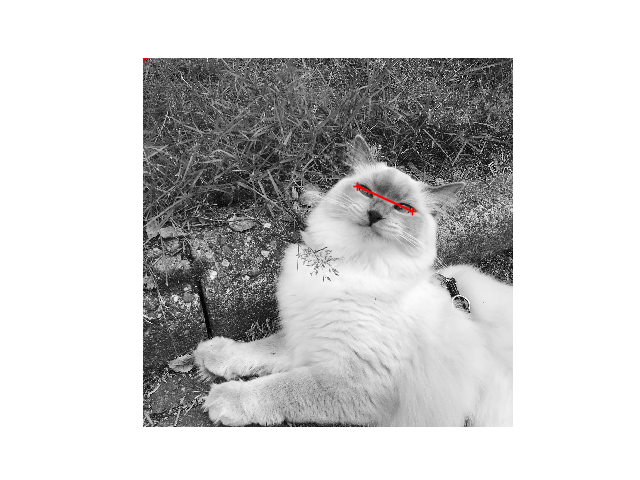

In [125]:
%matplotlib notebook
pts_img1 = utils.prompt_eye_selection(img1)
plt.plot(pts_img1[:,0], pts_img1[:,1], 'r-+')

<IPython.core.display.Javascript object>


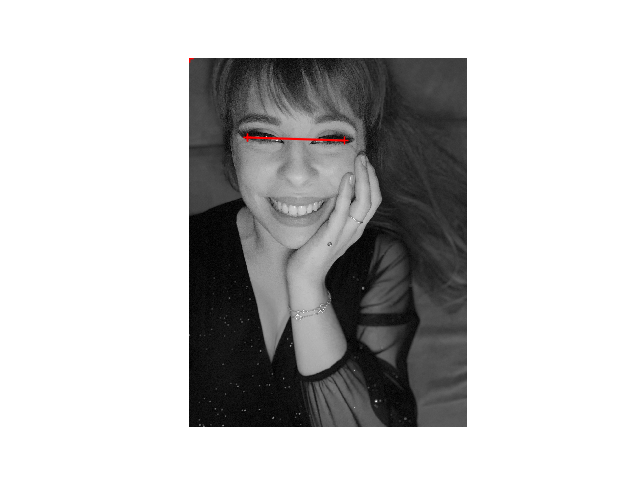

In [126]:
pts_img2 = utils.prompt_eye_selection(img2)
plt.plot(pts_img2[:,0], pts_img2[:,1], 'r-+')

In [131]:
%matplotlib inline
hybrid_img = pipeline('img2.jpg', 'img1.jpg', 4, 8, pts_img1, pts_img2)

<IPython.core.display.Javascript object>


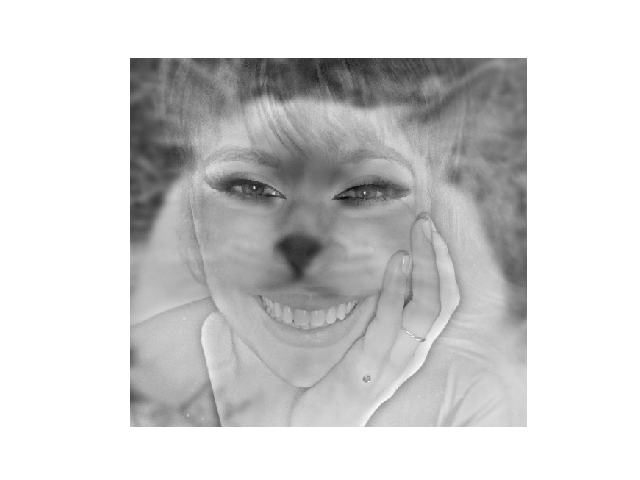

In [132]:
%matplotlib notebook
hybrid_img_cropped = utils.interactive_crop(hybrid_img)

In [133]:
hybrid = hybrid_img_cropped['cropped_image']

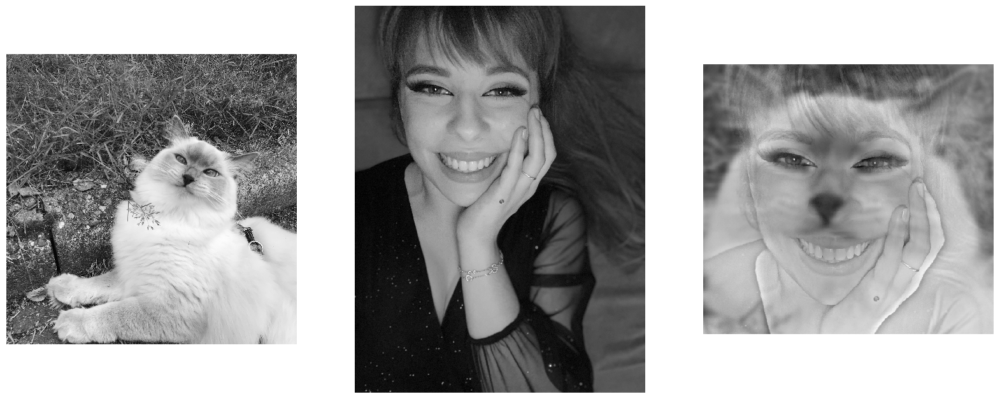

In [134]:
%matplotlib inline
fig = plt.figure(figsize=(20, 10))
for i, img in enumerate([img1, img2, hybrid]):
    _display(fig=fig, nrow=1, ncol=3, pos=i + 1, img=img, cmap='gray')
plt.savefig('hybrid_other2.png', bbox_inches='tight') 

---
# Image Enhancement
Sometimes we find that our photographs do not quite have the vivid colors or contrast that you remember seeing. In this part of the project, I'll look at three simple types of enhancement:
- Contrast Enhancement
- Color Enhancement
- Color Shift

## Load image
For this part I will use another image of Julia.

In [37]:
img_file = 'jula_low_contrast.jpg'

raw_img = cv2.imread(img_file)

img_RGB = cv2.cvtColor(raw_img, cv2.COLOR_BGR2RGB)
img_HSV = cv2.cvtColor(raw_img, cv2.COLOR_BGR2HSV)
img_LAB = cv2.cvtColor(raw_img, cv2.COLOR_BGR2LAB)

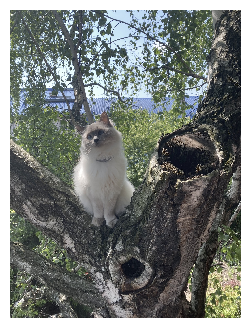

In [38]:
_display(img_RGB)

## Contrast enhancement 
The goal is to improve the contrast of the image. The poor constrast could be due to blurring in the capture process or due to the intensities not covering the full range. Potential fixes include Laplacian filtering, gamma correction, and histogram equalization.

### Gamma correction
Gamma correction is a method that allows to control the brightness of an image. The formula used to get a gamma corrected image is given below:
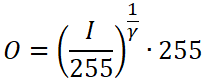

In [39]:
def gamma_correction(img: np.ndarray, gamma: float=1.0) -> np.ndarray:
    return (img) ** (1 / gamma)

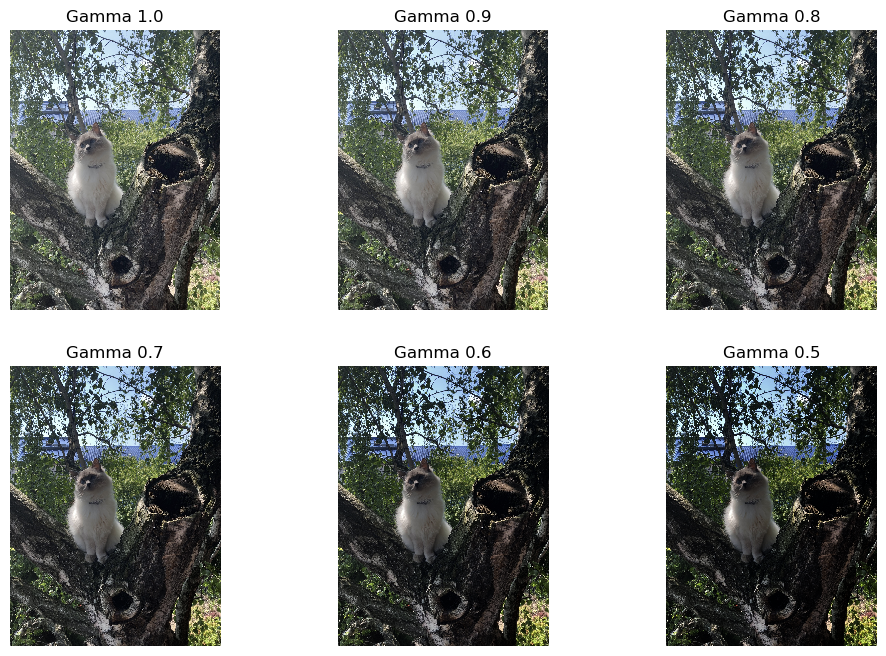

In [40]:
img = np.float32(img_RGB / 255.0)

fig = plt.figure(figsize=(12, 8))
c = 1

for gamma in np.arange(1.0, 0.4, -0.1):
    gamma_img = gamma_correction(img, gamma)
    _display(fig=fig, nrow=2, ncol=3, pos=c, img=gamma_img, title=f'Gamma {gamma:.1f}')
    c += 1

### Histogram equalization
Histogram equalization is a method of contrast adjustment using the image's histogram. This method spreads out the most frequent intensity values.

In [41]:
def _histogram(img: np.ndarray, save_name: str = None) -> np.ndarray:
    fig = plt.figure(figsize=(10, 3))

    ax = fig.add_subplot(1, 2, 1)
    ax.imshow(img, cmap='gray')
    ax.set_title('Image')
    ax.axis('off')

    ax = fig.add_subplot(1, 2, 2)
    ax.hist(img.flatten(), 256, [0,256], color = 'r')
    ax.axis(xmin=0,xmax=255)
    ax.set_title('Histogram original')
    
    if save_name:
        plt.savefig(save_name, bbox_inches='tight')

In [42]:
def _equalization(img: np.ndarray) -> np.ndarray:
    return cv2.equalizeHist(img)

#### Split channels and compute histograms

In [43]:
img_V = img_HSV[:,:,2]
img_HS = img_HSV[:,:,:2]

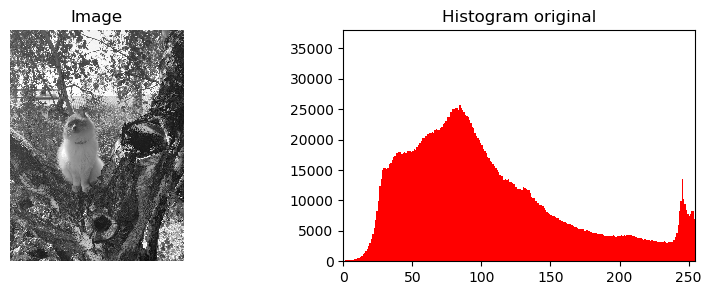

In [44]:
_histogram(img_V)

In [45]:
img_equ = _equalization(img_V)

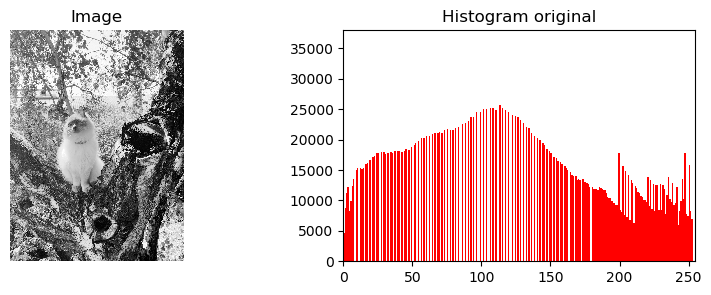

In [46]:
_histogram(img_equ)

#### Merge channels

In [47]:
img_out = cv2.merge([img_HS, img_equ])
img_out = cv2.cvtColor(img_out, cv2.COLOR_HSV2RGB)

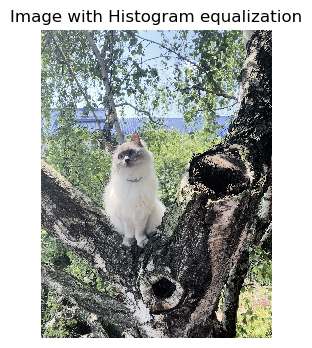

In [48]:
_display(img_out, title='Image with Histogram equalization')

## Color Enhancement
Sometimes our image doesn't have the vivid colors we would want. I can use the previously defined gamma correction method to boost the saturation.

In [49]:
def _color_boost(img: np.ndarray, scalar: float) -> np.ndarray:
    img[:, :, 1] = gamma_correction(img[:, :, 1], scalar) 
    return img

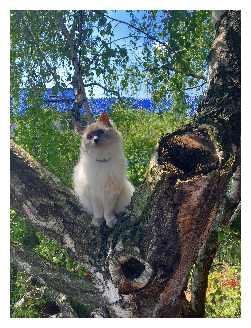

In [50]:
_img_HSV = _color_boost(img_HSV.copy(), 0.8)
_img_HSV = cv2.cvtColor(_img_HSV, cv2.COLOR_HSV2RGB)

_display(_img_HSV)

## Color Shift
Lets add a bit of color filter to the image! 

In [385]:
#def _color_shift(img: np.ndarray, scalar: float, channel: int) -> np.ndarray:
    #img[:, :, channel] = img[:, :, channel] * scalar
    #return img

In [162]:
def _red_range() -> (np.ndarray, np.ndarray):
    lower = np.array([0,127,120])
    upper = np.array([255,255,135])
    return lower, upper

def _yellow_range() -> (np.ndarray, np.ndarray):
    lower = np.array([0,120,127])
    upper = np.array([255,135,255])
    return lower, upper

def _color_mask(img: np.ndarray, lower_range: np.ndarray, upper_range: np.ndarray) -> np.ndarray:
    return cv2.inRange(img, lower_range, upper_range)

def _color_shift(img: np.ndarray, scalar: float, channel: int, color_range: Callable) -> np.ndarray:
    lower, upper = color_range()
    mask = _color_mask(img, lower, upper)
    
    for i in range(mask.shape[0]):
        for j in range(mask.shape[1]):
            if not mask[i][j]:
                continue
            img[i,j,1] = img[i,j,1]*scalar
    return img

#### More red

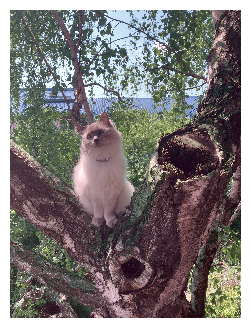

In [166]:
img_red = _color_shift(img_LAB.copy(), 1.1, 1, _red_range)

_display(cv2.cvtColor(img_red, cv2.COLOR_LAB2RGB))

#### Less yellow

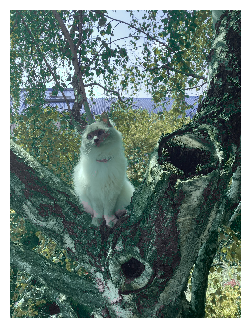

In [165]:
img_yellow = _color_shift(img_LAB.copy(), 0.9, 2, _yellow_range)

_display(cv2.cvtColor(img_yellow, cv2.COLOR_LAB2RGB))

## Enhancement pipeline
Now, lets create the best image using the above methods.

### Load image

In [58]:
img_file = 'low_contrast.jpg'

raw_img = cv2.imread(img_file)

### Define steps

In [59]:
def _contrast_enhancement(rgb_img: np.ndarray) -> np.ndarray:
    hsv_img = cv2.cvtColor(rgb_img, cv2.COLOR_RGB2HSV)
    
    V = hsv_img[:,:,2]
    HS = hsv_img[:,:,:2]
    
    equ = _equalization(V)
    
    out = cv2.merge([HS, equ])
    return cv2.cvtColor(out, cv2.COLOR_HSV2RGB)

def _color_enhancement(rgb_img: np.ndarray, gamma: float) -> np.ndarray:
    hsv_img = cv2.cvtColor(rgb_img, cv2.COLOR_RGB2HSV)
    
    hsv_img[:, :, 1] = gamma_correction(hsv_img[:, :, 1], gamma) 
    
    return cv2.cvtColor(hsv_img, cv2.COLOR_HSV2RGB)

def _red_boost(rgb_img: np.ndarray, intensity: float) -> np.ndarray:
    lab_img = cv2.cvtColor(rgb_img, cv2.COLOR_RGB2LAB)
    
    lab_img = _color_shift(lab_img, intensity, 1, _red_range)
    
    return cv2.cvtColor(lab_img, cv2.COLOR_LAB2RGB)

def _blue_boost(rgb_img: np.ndarray, intensity: float) -> np.ndarray:
    lab_img = cv2.cvtColor(rgb_img, cv2.COLOR_RGB2LAB)
    
    lab_img = _color_shift(lab_img, intensity, 2, _yellow_range)
    
    return cv2.cvtColor(lab_img, cv2.COLOR_LAB2RGB)

### Define pipeline

In [60]:
def _enhancement_pipeline(
    rgb_img: np.ndarray,
    saturation: float, 
    red_intensity: float, 
    blue_intensity: float
) -> None:
    imgs = {
        'Original': rgb_img
    }
    
    img_contrast = _contrast_enhancement(rgb_img)
    imgs['Contrast boost'] = img_contrast
    
    img_saturation = _color_enhancement(img_contrast, saturation)
    imgs['Saturation boost'] = img_saturation
    
    img_red = _red_boost(img_saturation, red_intensity)
    imgs['More red'] = img_red
    
    img_blue = _blue_boost(img_red, blue_intensity)
    imgs['Less yellow'] = img_blue
    
    final = img_blue
    
    return imgs, final

### Run pipeline

In [61]:
saturation = 0.8
red_intensity = 1.04
blue_intensity = 0.97

steps, enhancement_img = _enhancement_pipeline(img_RGB, saturation, red_intensity, blue_intensity)

#### Pipeline visualization

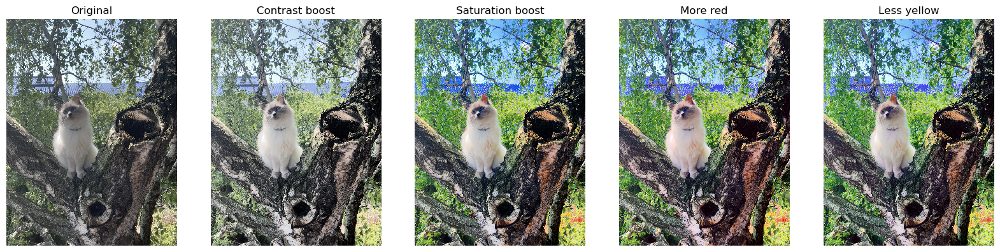

In [62]:
fig = plt.figure(figsize=(20, 20))
c = 1

for title, img in steps.items(): 
    _display(fig=fig, nrow=1, ncol=len(steps.keys()), pos=c, img=img, title=title)
    c += 1

#### Final output comparison

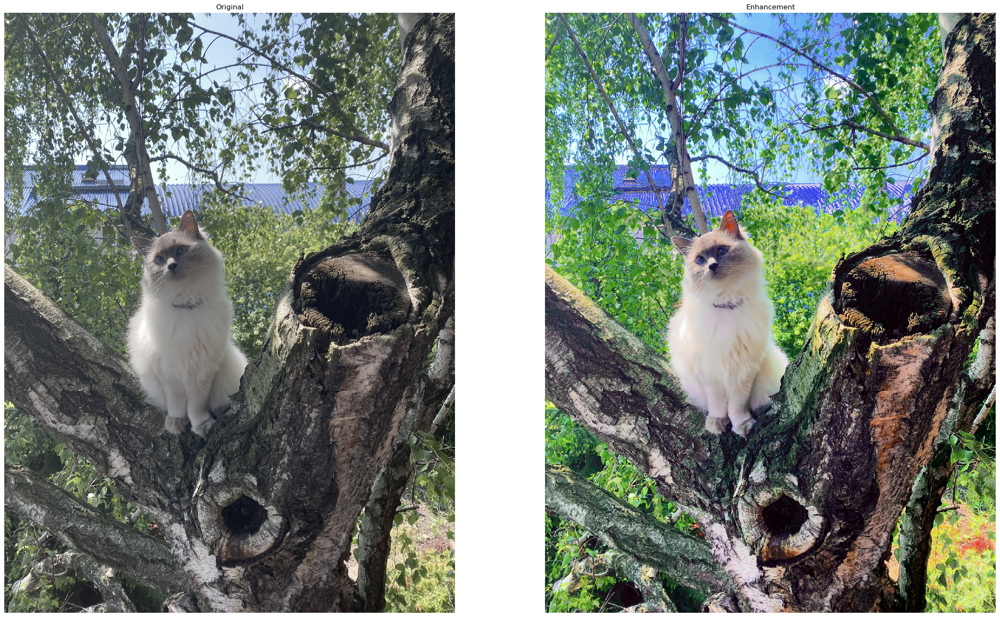

In [63]:
fig = plt.figure(figsize=(30, 30))

_display(fig=fig, nrow=1, ncol=2, pos=1, img=img_RGB, title='Original')
_display(fig=fig, nrow=1, ncol=2, pos=2, img=enhancement_img, title='Enhancement')

---
# Attribution

- [IMAGE] seal image: ref. https://www.wallpaperflare.com/smiling-baby-seal-white-seal-animal-snow-winter-ice-wallpaper-tiirw
- [CODE]  display image at different scale: ref. https://stackoverflow.com/questions/47254294/how-to-concatenate-images-of-different-shapes-using-python-and-opencv)
- [CODE]  utils.py code: author Derek Hoiem